<a href="https://colab.research.google.com/github/agarwalsourabh55/Age_Gender_Detection_Project/blob/main/car_crash_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Check if GPU is available
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found, to activate the GPU go to menu "Runtime" and submenu "Change runtime type", then change hardware accelerator from None to GPU.')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [2]:
# Check is Link to Drive is OK
google = !if [ -d 'mydrive/' ]; then echo "1" ; else echo "0"; fi
if (google[0] is '0' ):
  from google.colab import drive
  drive.mount('/content/mydrive')
!if [ -d 'mydrive/' ]; then echo "Connection to Google drive successful" ; else echo "Error to connect to Google drive"; fi

Mounted at /content/mydrive
Connection to Google drive successful


In [ ]:
!pip install --upgrade pip  > /dev/null
!pip install scipy==1.0.0 > /dev/null
!pip install http://download.pytorch.org/whl/cu75/torch-0.3.0.post4-cp36-cp36m-linux_x86_64.whl  && pip install torchvision
#!pip install Pillow==4.0.0 > /dev/null
!pip install Pillow==4.1.1 > /dev/null
#!pip install PIL  > /dev/null
!pip install image  > /dev/null
!pip install fastai==0.7.0  > /dev/null
!apt update && apt install -y libsm6 libxext6 > /dev/null

In [4]:
PATH = "mydrive/MyDrive/CarCrashDetection/Dataset/"
valid_accident = !ls {PATH}valid/accident 
valid_no_accident = !ls {PATH}valid/no_accident
train_accident = !ls {PATH}train/accident
train_no_accident = !ls {PATH}train/no_accident

print(f"Number of valid images with accident: {len(valid_accident)}")
print(f"Number of valid images with no_accident: {len(valid_no_accident)}")
print(f"Number of train images with accident: {len(train_accident)}")
print(f"Number of train images with no_accident: {len(train_no_accident)}")

Number of valid images with accident: 21
Number of valid images with no_accident: 14
Number of train images with accident: 36
Number of train images with no_accident: 29


## 2.3 Quick look a no_accident image

(360, 640, 4)

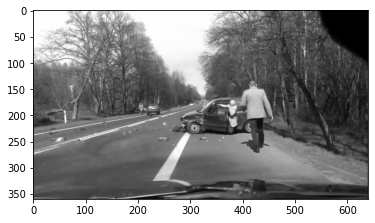

In [5]:
import matplotlib.pyplot as plt
files = !ls {PATH}valid/no_accident | head
img = plt.imread(f'{PATH}valid/no_accident/{files[5]}')
plt.imshow(img);
img.shape

In [19]:
# This file contains all the main libs we'll use
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
%matplotlib inline
from fastai.imports import *
from fastai.vision import *
from fastai.metrics import error_rate



In [12]:
data = ImageDataBunch.from_folder(PATH, ds_tfms=get_transforms(), size=224, valid_pct = 0.2)
print(data.classes)
data.show_batch(rows=3, figsize=(7,6))
learn = cnn_learner(data, models.resnet34, metrics=accuracy)
learn.fit_one_cycle(10)
learn.save('stage-1')



['accident', 'no_accident']

In [17]:
pred_path="mydrive/MyDrive/CarCrashDetection/Dataset/valid"      # Use the same PATH than Environment Setup
il = ImageList.from_folder(pred_path); il


ImageList (148 items)
Image (3, 360, 640),Image (3, 360, 640),Image (3, 360, 640),Image (3, 360, 640),Image (3, 360, 640)
Path: mydrive/MyDrive/CarCrashDetection/Dataset/valid

/usr/local/lib/python3.7/dist-packages/fastai/vision/image.py:434: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if ax is None: fig,ax = plt.subplots(figsize=figsize)
/usr/local/lib/python3.7/dist-packages/fastai/vision/image.py:434: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if ax is None: fig,ax = plt.subplots(figsize=figsize)
/usr/local/lib/python3.7/dist-packages/fastai/vision/image.py:434: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until e

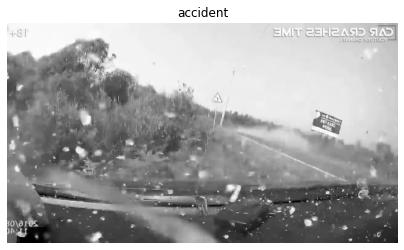

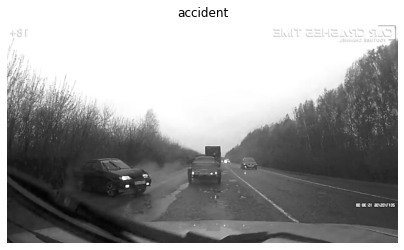

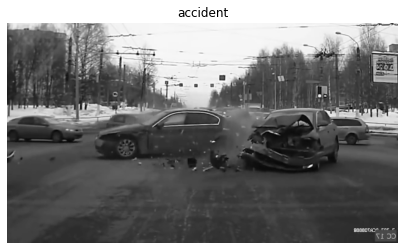

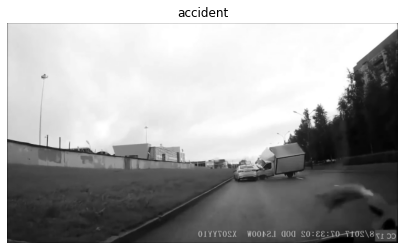

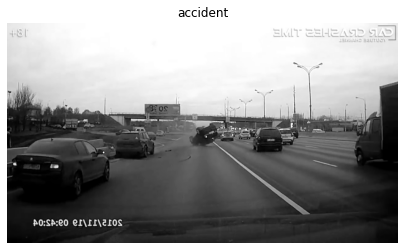

...

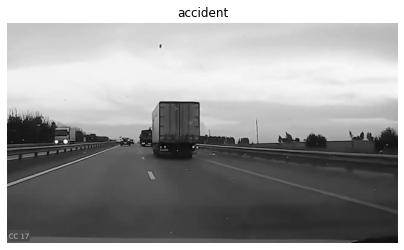

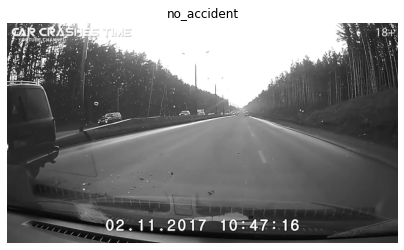

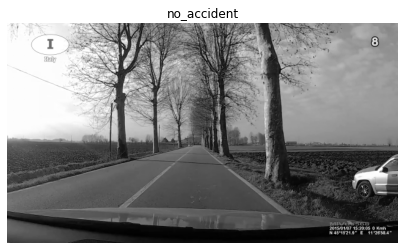

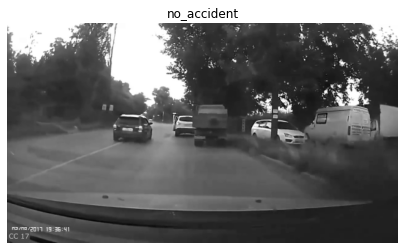

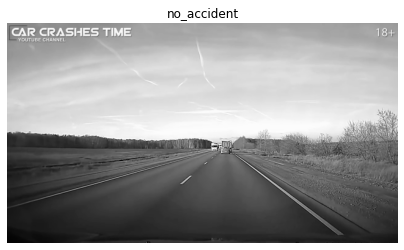

In [ ]:
for img in il:
   prediction = learn.predict(img)
   img.show(figsize=(7,5), title = str(prediction[0]))